# Star Wars Anaylsis - Data Project 
**Creator: Cesar Gutierrez**                 
**Contact Information: Cesargutierrez.email@gmail.com**             
**Data: https://www.kaggle.com/datasets/ulrikthygepedersen/star-wars-characters**              

**Importing the necessary libraries for the analysis:**

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd 

**Loading the data into a data frame, named df:**

In [4]:
star_wars_data = pd.read_csv('star_wars_character_dataset.csv')
star_wars_data

,name,height,mass,hair_color,skin_color,eye_color,birth_year,sex,gender,homeworld,species,films,vehicles,starships
0,Luke Skywalker,172.0,77.0,blond,fair,blue,19.0,male,masculine,Tatooine,Human,"The Empire Strikes Back, Revenge of the Sith, ...","Snowspeeder, Imperial Speeder Bike","X-wing, Imperial shuttle"
1,C-3PO,167.0,75.0,NaN,gold,yellow,112.0,none,masculine,Tatooine,Droid,"The Empire Strikes Back, Attack of the Clones,...",NaN,NaN
2,R2-D2,96.0,32.0,NaN,"white, blue",red,33.0,none,masculine,Naboo,Droid,"The Empire Strikes Back, Attack of the Clones,...",NaN,NaN
3,Darth Vader,202.0,136.0,none,white,yellow,41.9,male,masculine,Tatooine,Human,"The Empire Strikes Back, Revenge of the Sith, ...",NaN,TIE Advanced x1
4,Leia Organa,150.0,49.0,brown,light,brown,19.0,female,feminine,Alderaan,Human,"The Empire Strikes Back, Revenge of the Sith, ...",Imperial Speeder Bike,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,Rey,NaN,NaN,brown,light,hazel,NaN,female,feminine,NaN,Human,The Force Awakens,NaN,NaN
83,Poe Dameron,NaN,NaN,brown,light,brown,NaN,male,masculine,NaN,Human,The Force Awakens,NaN,T-70 X-wing fighter
84,BB8,NaN,NaN,none,none,black,NaN,none,masculine,NaN,Droid,The Force Awakens,NaN,NaN
85,Captain Phasma,NaN,NaN,unknown,unknown,unknown,NaN,NaN,NaN,NaN,NaN,The Force Awakens,NaN,NaN


**Here we check the data types and missing values:**

In [6]:
print(star_wars_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        87 non-null     object 
 1   height      81 non-null     float64
 2   mass        59 non-null     float64
 3   hair_color  82 non-null     object 
 4   skin_color  87 non-null     object 
 5   eye_color   87 non-null     object 
 6   birth_year  43 non-null     float64
 7   sex         83 non-null     object 
 8   gender      83 non-null     object 
 9   homeworld   77 non-null     object 
 10  species     83 non-null     object 
 11  films       87 non-null     object 
 12  vehicles    11 non-null     object 
 13  starships   20 non-null     object 
dtypes: float64(3), object(11)
memory usage: 9.6+ KB
None


# Heights #

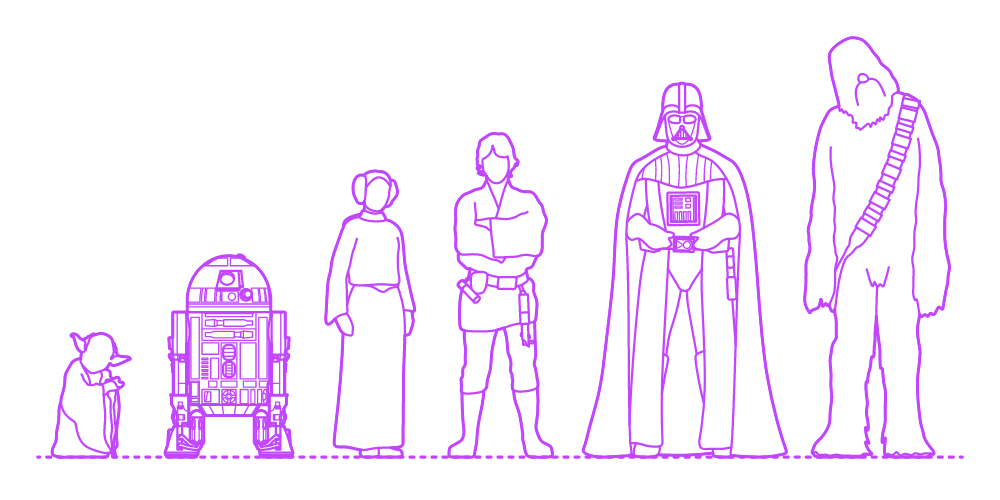

**Let's find out the distribution of heights inside the Star Wars universe:**

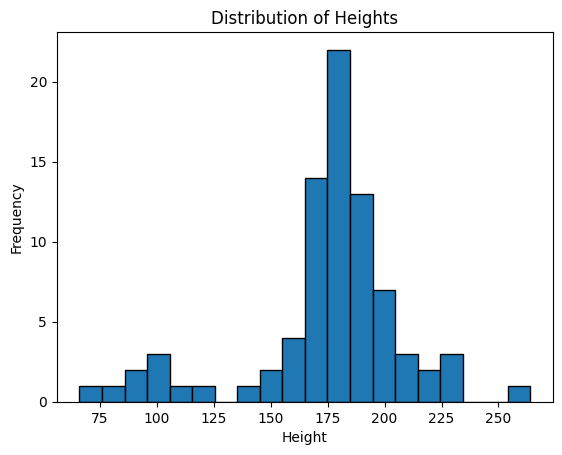

In [8]:
# Plot the distribution of heights
plt.hist(star_wars_data['height'], bins=20, edgecolor='black')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.title('Distribution of Heights')
plt.show()

Analysis:

From the histogram we can see that the majoirty characters are around the heights of around 160 to 190 cm, with the highest amount being approximatly 178cm. In U.S. standards that translates to 5'2 to 6'3ish and the largest amount of charcters being around 5'10. Surprising, given all the different species in the movies.  

For fun, let's see some noticeable entries:

In [21]:
tallest = star_wars_data.nlargest(1, 'height')
tallest

,name,height,mass,hair_color,skin_color,eye_color,birth_year,sex,gender,homeworld,species,films,vehicles,starships
53,Yarael Poof,264.0,NaN,none,white,yellow,NaN,male,masculine,Quermia,Quermian,The Phantom Menace,NaN,NaN


In [23]:
shortest = star_wars_data.nsmallest(1, 'height')
shortest

,name,height,mass,hair_color,skin_color,eye_color,birth_year,sex,gender,homeworld,species,films,vehicles,starships
18,Yoda,66.0,17.0,white,green,brown,896.0,male,masculine,NaN,Yoda's species,"The Empire Strikes Back, Attack of the Clones,...",NaN,NaN


It appears that our tallest character is Yarael Poof and our shortest is Yoda.

# Planets #

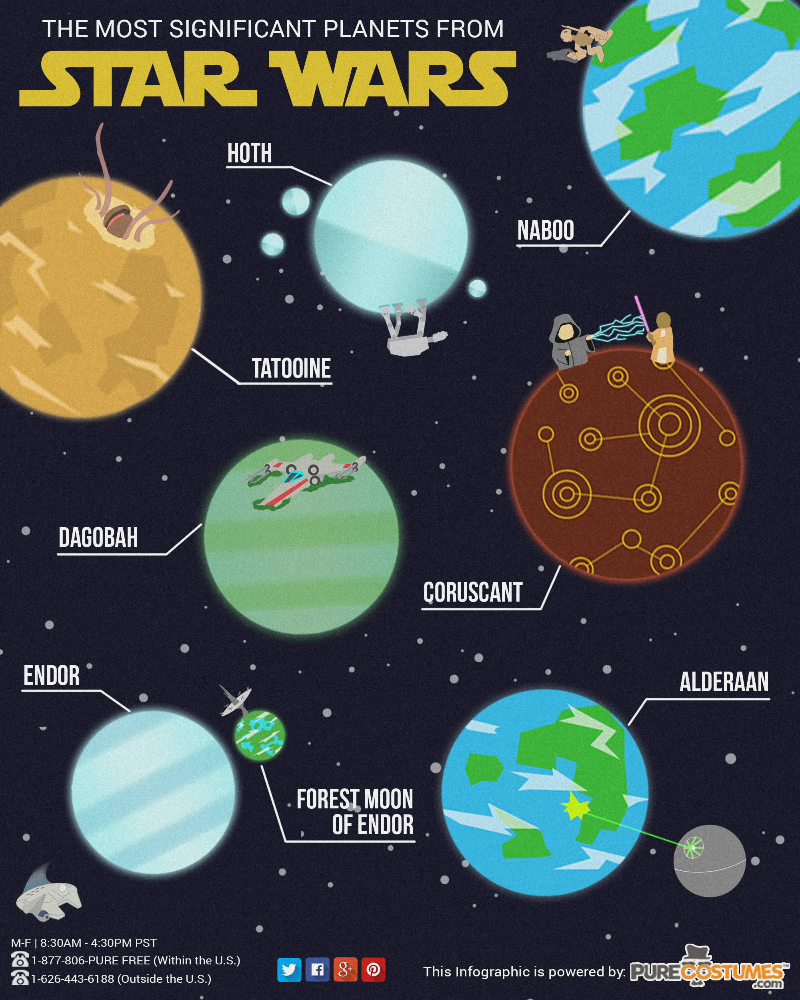

In [12]:
# Count the occurrences of each home planet
planet_counts = star_wars_data['homeworld'].value_counts()
planet_counts

Naboo             11
Tatooine          10
Alderaan           3
Kamino             3
Coruscant          3
Mirial             2
Kashyyyk           2
Corellia           2
Ryloth             2
Iridonia           1
Iktotch            1
Quermia            1
Dorin              1
Champala           1
Geonosis           1
Zolan              1
Serenno            1
Concord Dawn       1
Cerea              1
Ojom               1
Aleen Minor        1
Skako              1
Muunilinst         1
Shili              1
Kalee              1
Umbara             1
Glee Anselm        1
Vulpter            1
Haruun Kal         1
Tund               1
Stewjon            1
Eriadu             1
Rodia              1
Nal Hutta          1
Bestine IV         1
Trandosha          1
Socorro            1
Bespin             1
Mon Cala           1
Chandrila          1
Endor              1
Sullust            1
Cato Neimoidia     1
Toydaria           1
Malastare          1
Dathomir           1
Troiken            1
Utapau       

**Let's find out what's the most common homeworld:**

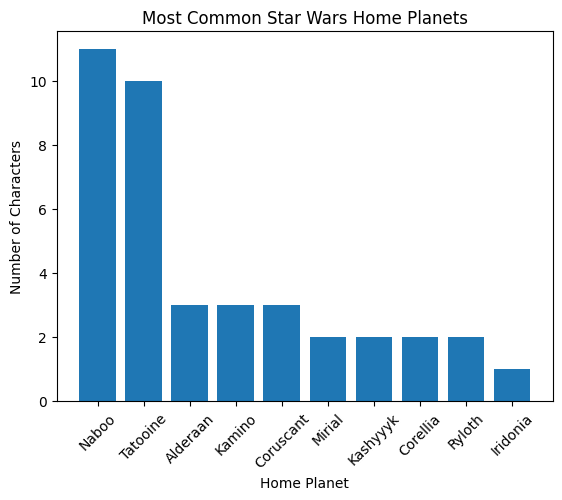

In [18]:
# Plot the most common home planets
# Here we are just going to find the top ten planets
plt.bar(planet_counts.index[:10], planet_counts[:10])
plt.xlabel('Home Planet')
plt.ylabel('Number of Characters')
plt.title('Most Common Star Wars Home Planets')
plt.xticks(rotation=45)
plt.show()

Analysis:

From the bar graph we can see that Naboo is the most popular planet that star wars characters are from. 

# Gender #

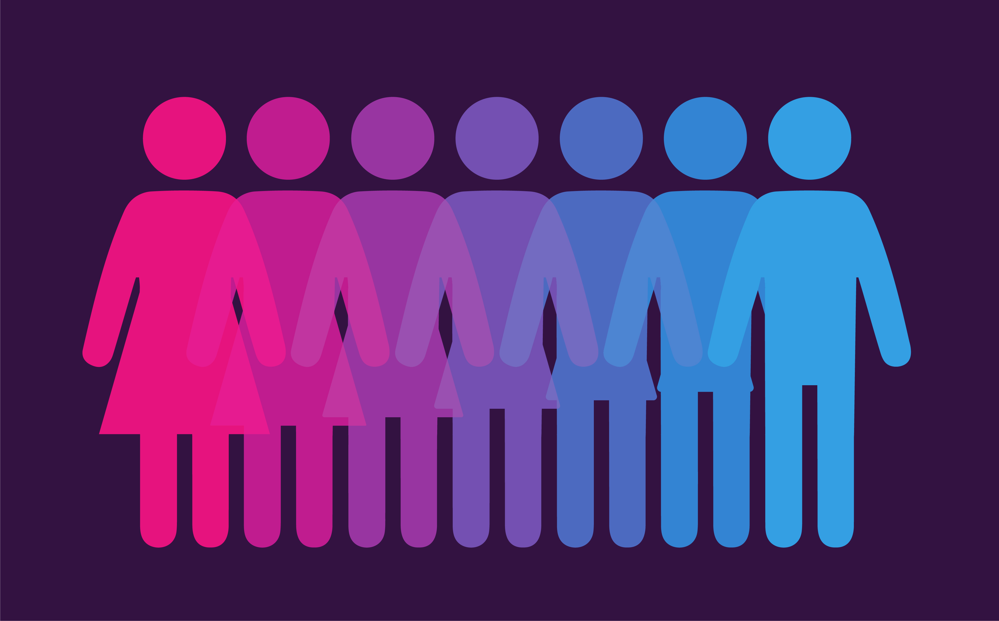

In [26]:
# Count the occurrences of each home planet
gender_counts = star_wars_data['gender'].value_counts()
gender_counts

masculine    66
feminine     17
Name: gender, dtype: int64

In the data used, there appears to only be two categories for gender, masculine and feminine. Let's see the amount of each in the data set:

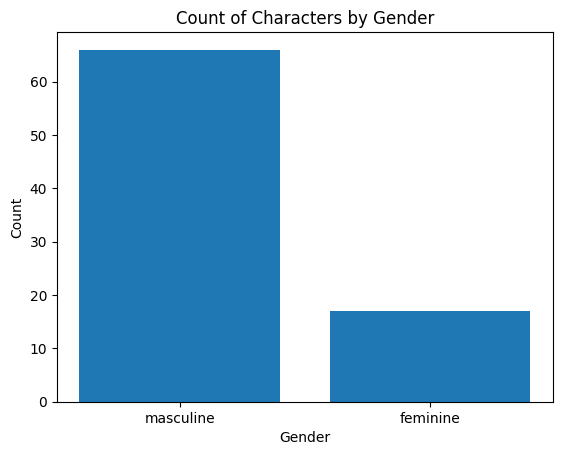

In [24]:
# Plot the count of characters by gender
plt.bar(star_wars_data['gender'].value_counts().index, star_wars_data['gender'].value_counts())
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Count of Characters by Gender')
plt.show()

Analysis:

From simply looking at the bar graph it is clear that there is a gap in the amount of masculine presenting and feminine presenting characters in the Star Wars movies.

## Now let's look at the stats of some of the most iconic characters in Star Wars ##

**First up is my personal favorite, Obi-Wan Kenobi:**

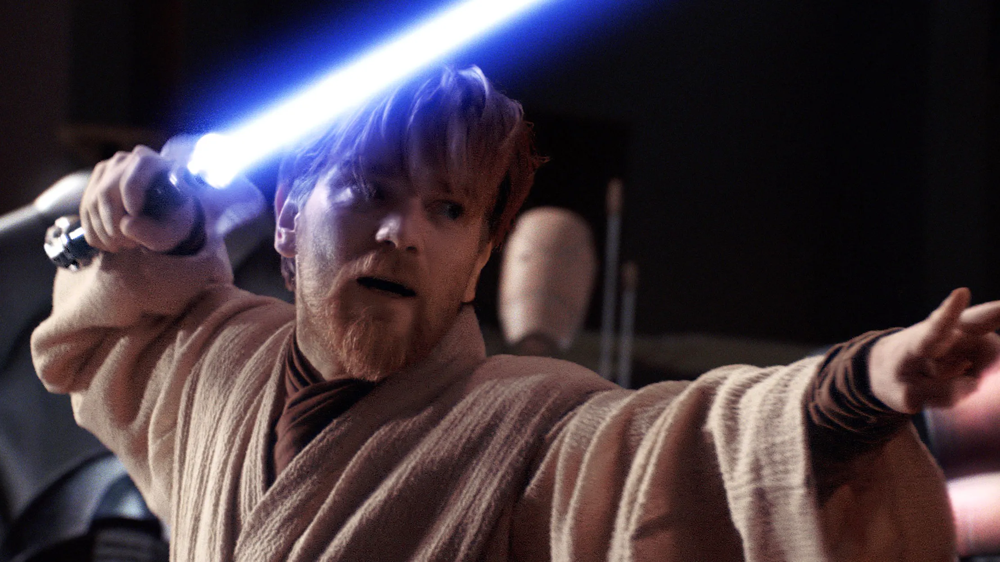

In [30]:
obi_wan_data = star_wars_data[star_wars_data['name'] == 'Obi-Wan Kenobi']

In [37]:
obi_height = obi_wan_data['height']
obi_height

9    182.0
Name: height, dtype: float64

In [33]:
obi_weight = obi_wan_data['mass']
obi_weight

9    77.0
Name: mass, dtype: float64

In [34]:
obi_homeworld = obi_wan_data['homeworld']
obi_homeworld

9    Stewjon
Name: homeworld, dtype: object

According to the data, Obi-Wan Kenobi is 182 cm (or about 6 ft) tall, weighs about 77 kg (or about 169 lbs), and is orginally from the planet Stewjon.

**Up next is Yoda:**

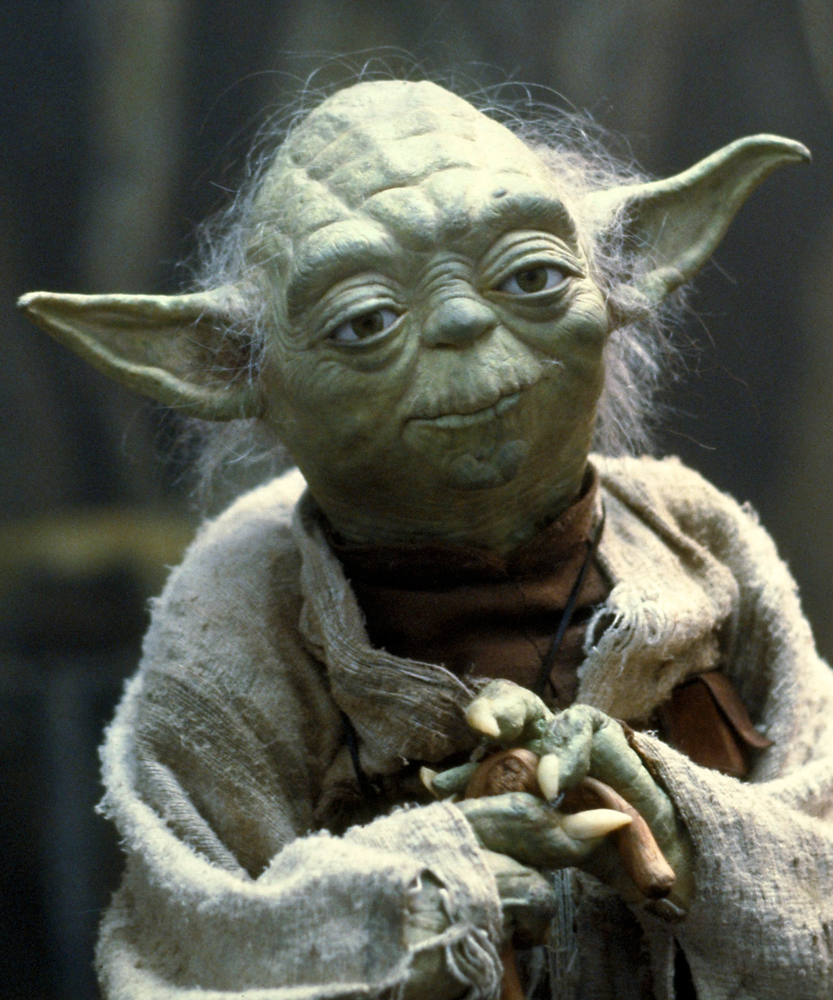

In [49]:
Yoda_data = star_wars_data[star_wars_data['name'] == 'Yoda']

In [50]:
Yoda_height = Yoda_data['height']
Yoda_height

18    66.0
Name: height, dtype: float64

In [57]:
Yoda_weight = Yoda_data['mass']
Yoda_weight

18    17.0
Name: mass, dtype: float64

In [ ]:
Yoda_homeworld = Yoda_data['homeworld']
Yoda_homeworld

18    NaN
Name: homeworld, dtype: object

According to the data, Yoda is 66 cm (or about 2ft tall), weighs 12 kg (or about 37 lbs), and we do not know is homeworld. 

**Last up is Luke Skywalker:**

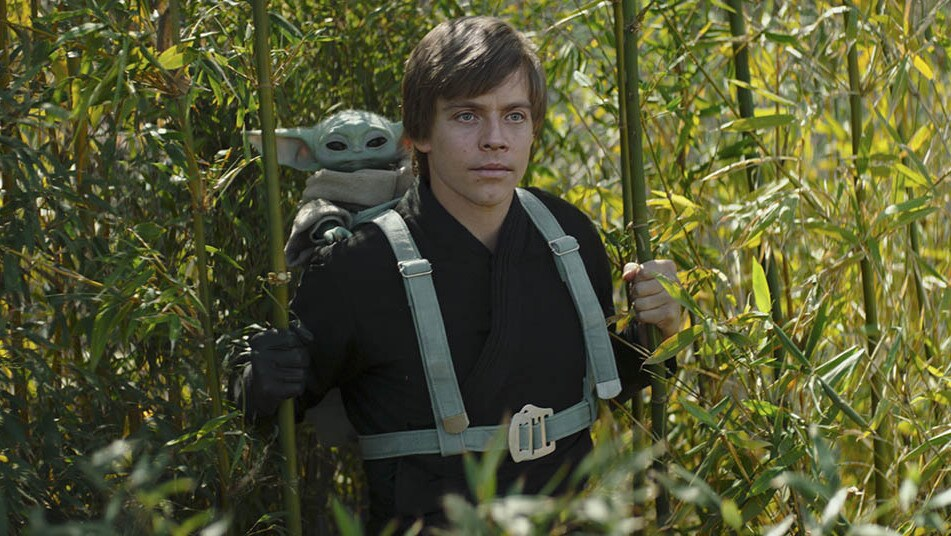

In [ ]:
Luke_Skywalker_data = star_wars_data[star_wars_data['name'] == 'Luke Skywalker']

In [ ]:
Luke_Skywalker_height = Luke_Skywalker_data['height']
Luke_Skywalker_height

0    172.0
Name: height, dtype: float64

In [58]:
Luke_Skywalker_weight = Luke_Skywalker_data['mass']
Luke_Skywalker_weight

0    77.0
Name: mass, dtype: float64

In [59]:
Luke_Skywalker_homeworld = Luke_Skywalker_data['homeworld']
Luke_Skywalker_homeworld

0    Tatooine
Name: homeworld, dtype: object

According to the data, Luke Skywalker is 172 cm tall (or about 5'7), weighs around 77 kg (or about 169 lbs), and is from the planet Tatooine.